# Part 1 Data Engineeing (20%)
###1. Data exploration & analysis


**Set the seed to 42**

In [ ]:
import torch
from torchvision import transforms
from torch.utils.data import DataLoader, random_split
from torchvision.datasets import Flowers102
import random
import numpy as np

SEED = 42
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)
np.random.seed(SEED)
random.seed(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

**Download flowers102 dataset using Torchvision, load the default test, val and test split from Torchvision. Observe the classes and total sample in each of the split**

**Train and validation has total 1020 images for each the dataset, for test set it has 6149, which is more that both the train and validation set**

In [ ]:
def print_dataset_info(name, dataset):
    print(f"\n{name} Dataset")
    print("-" * (len(name) + 8))
    print(f"Number of classes : {len(dataset.classes)}")
    print(f"Classes           : {dataset.classes}")
    print(f"Total samples     : {len(dataset)}")

train_dataset = Flowers102(
    root="./data",
    split="train",
    transform=None,
    download=True
)
val_dataset = Flowers102(root="./data", split="val", transform=None)

test_dataset = Flowers102(root="./data", split="test", transform=None)

print_dataset_info("Train", train_dataset)
print_dataset_info("Validation", val_dataset)
print_dataset_info("Test", test_dataset)

100%|██████████| 345M/345M [00:20<00:00, 16.9MB/s]
100%|██████████| 502/502 [00:00<00:00, 1.09MB/s]
100%|██████████| 15.0k/15.0k [00:00<00:00, 44.8MB/s]



Train Dataset
-------------
Number of classes : 102
Classes           : ['pink primrose', 'hard-leaved pocket orchid', 'canterbury bells', 'sweet pea', 'english marigold', 'tiger lily', 'moon orchid', 'bird of paradise', 'monkshood', 'globe thistle', 'snapdragon', "colt's foot", 'king protea', 'spear thistle', 'yellow iris', 'globe-flower', 'purple coneflower', 'peruvian lily', 'balloon flower', 'giant white arum lily', 'fire lily', 'pincushion flower', 'fritillary', 'red ginger', 'grape hyacinth', 'corn poppy', 'prince of wales feathers', 'stemless gentian', 'artichoke', 'sweet william', 'carnation', 'garden phlox', 'love in the mist', 'mexican aster', 'alpine sea holly', 'ruby-lipped cattleya', 'cape flower', 'great masterwort', 'siam tulip', 'lenten rose', 'barbeton daisy', 'daffodil', 'sword lily', 'poinsettia', 'bolero deep blue', 'wallflower', 'marigold', 'buttercup', 'oxeye daisy', 'common dandelion', 'petunia', 'wild pansy', 'primula', 'sunflower', 'pelargonium', 'bishop of ll

**To check if there is overlapping images between train, validation and test files**

**No overlapping image found**

In [ ]:
train_files = set(train_dataset._image_files)
val_files   = set(val_dataset._image_files)
test_files  = set(test_dataset._image_files)

len(train_files & val_files), len(train_files & test_files), len(val_files & test_files)

(0, 0, 0)

**Observe the distribution of images accross the classes**

**images of each classes in train and validation set are equally distributed (10images each class), for test set, the distribution are uneven**

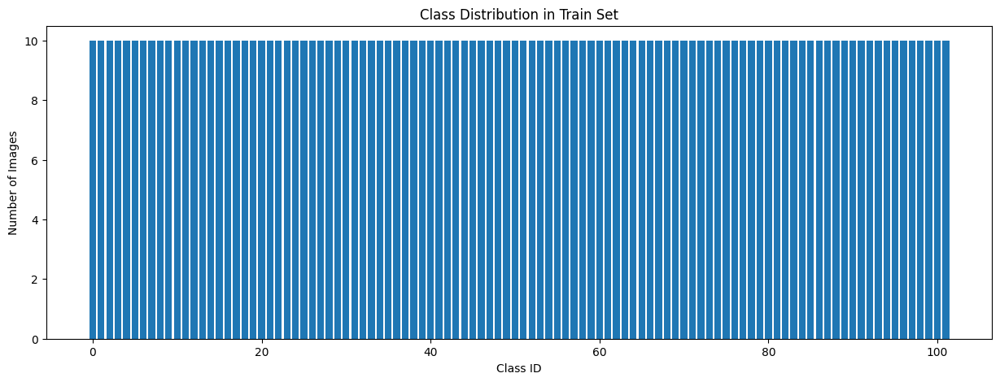

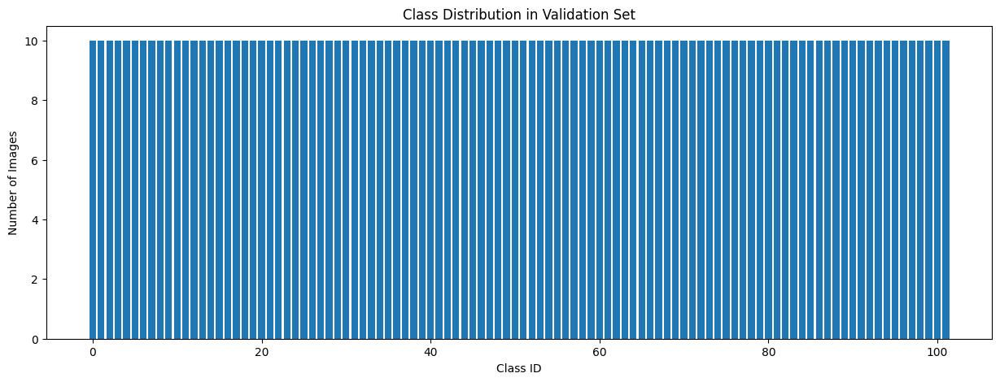

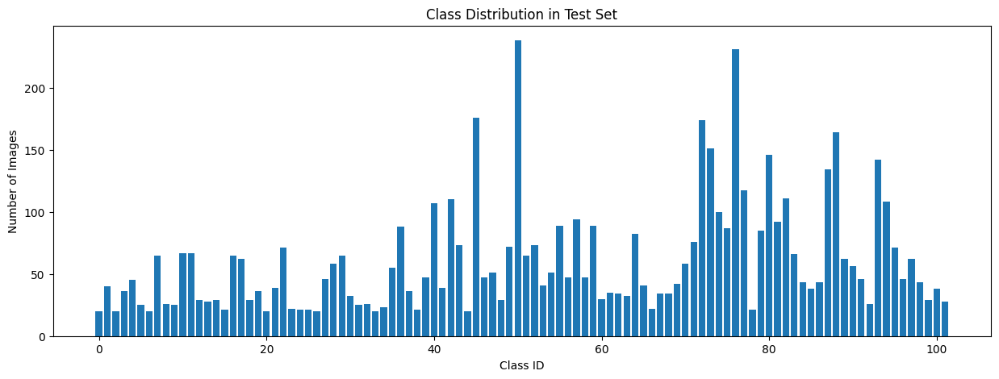

In [ ]:
import matplotlib.pyplot as plt
from collections import Counter
def plot_class_distribution(dataset, split_name="Dataset"):
    labels = [label for _, label in dataset]
    class_counts = Counter(labels)

    # Sort classes
    classes = sorted(class_counts.keys())
    counts = [class_counts[c] for c in classes]

    plt.figure(figsize=(15,5))
    plt.bar(classes, counts)
    plt.title(f"Class Distribution in {split_name}")
    plt.xlabel("Class ID")
    plt.ylabel("Number of Images")
    plt.show()

plot_class_distribution(train_dataset, "Train Set")
plot_class_distribution(val_dataset, "Validation Set")
plot_class_distribution(test_dataset, "Test Set")

**Observe the detail numbers of images in each class in the test set, as the distribution is not equal. Checking the min and max number of images for the classes.**

**Max images in a class: 238**

**Min images in a class: 20**

**Ratio (max/min): 11.90**

In [ ]:
def check_class_distribution(dataset, split_name="Dataset"):
    labels = [label for _, label in dataset]
    class_counts = Counter(labels)
    print(f"\n=== {split_name} ===")
    for class_id, count in sorted(class_counts.items()):
        print(f"Class {class_id}: {count} images")
    max_count = max(class_counts.values())
    min_count = min(class_counts.values())
    print(f"Max images in a class: {max_count}")
    print(f"Min images in a class: {min_count}")
    print(f"Ratio (max/min): {max_count / min_count:.2f}")

check_class_distribution(test_dataset, "Test Set")


=== Test Set ===
Class 0: 20 images
Class 1: 40 images
Class 2: 20 images
Class 3: 36 images
Class 4: 45 images
Class 5: 25 images
Class 6: 20 images
Class 7: 65 images
Class 8: 26 images
Class 9: 25 images
Class 10: 67 images
Class 11: 67 images
Class 12: 29 images
Class 13: 28 images
Class 14: 29 images
Class 15: 21 images
Class 16: 65 images
Class 17: 62 images
Class 18: 29 images
Class 19: 36 images
Class 20: 20 images
Class 21: 39 images
Class 22: 71 images
Class 23: 22 images
Class 24: 21 images
Class 25: 21 images
Class 26: 20 images
Class 27: 46 images
Class 28: 58 images
Class 29: 65 images
Class 30: 32 images
Class 31: 25 images
Class 32: 26 images
Class 33: 20 images
Class 34: 23 images
Class 35: 55 images
Class 36: 88 images
Class 37: 36 images
Class 38: 21 images
Class 39: 47 images
Class 40: 107 images
Class 41: 39 images
Class 42: 110 images
Class 43: 73 images
Class 44: 20 images
Class 45: 176 images
Class 46: 47 images
Class 47: 51 images
Class 48: 29 images
Class 49:

**Observe the image size distribution of the image in each of the dataset. 500x500px is the min for the images**


=== Train ===
Number of sampled images: 500
Width - min: 500, max: 857, average: 627.2
Height - min: 500, max: 913, average: 534.3


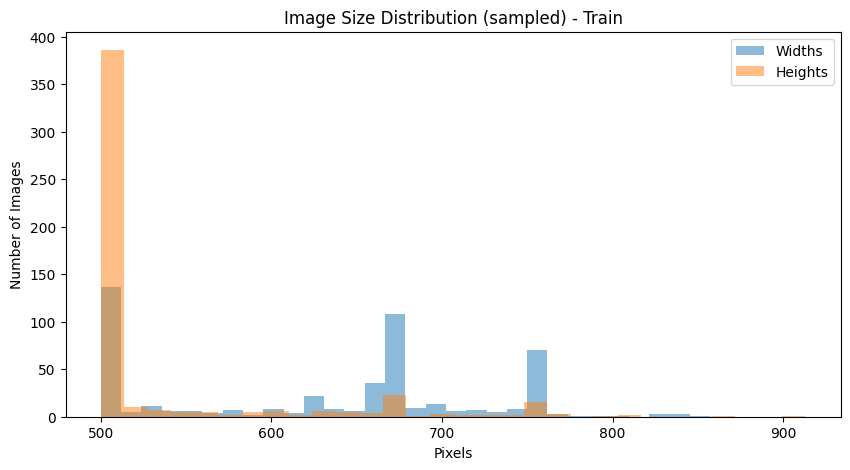


=== Validation ===
Number of sampled images: 500
Width - min: 500, max: 885, average: 625.6
Height - min: 500, max: 1066, average: 527.9


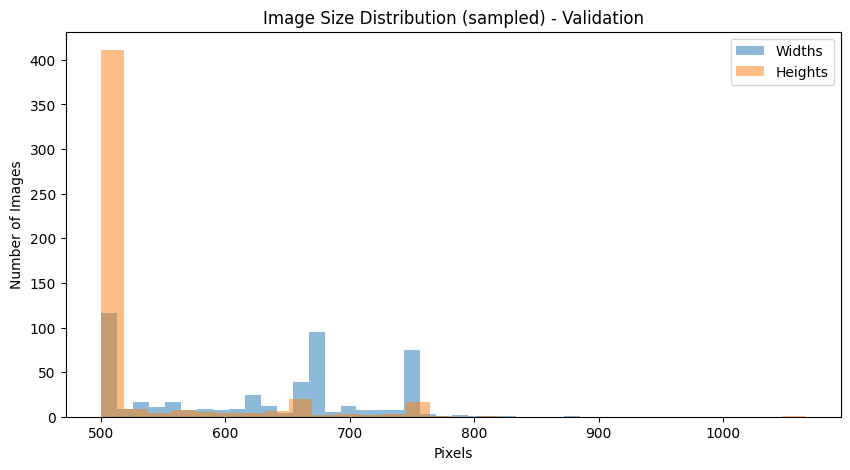


=== Test ===
Number of sampled images: 500
Width - min: 500, max: 852, average: 638.2
Height - min: 500, max: 895, average: 532.9


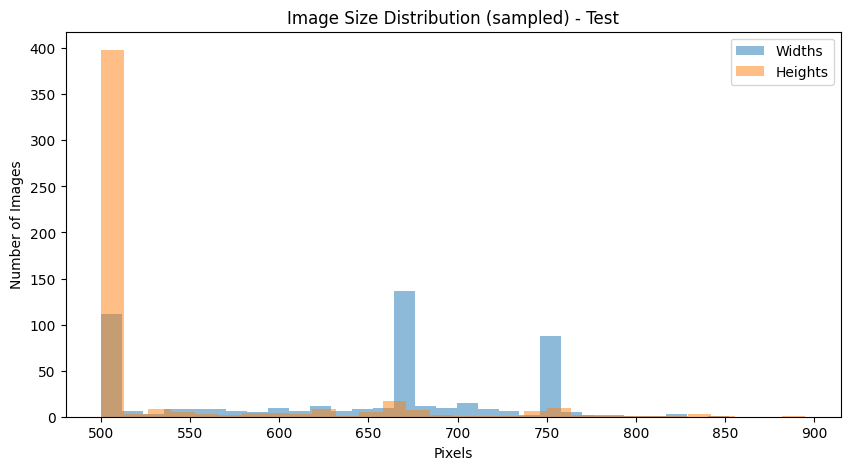

In [ ]:
def sample_image_sizes(dataset, sample_size=500):
    """Sample image sizes from the dataset"""
    sample_indices = random.sample(range(len(dataset)), min(sample_size, len(dataset)))
    widths, heights = [], []
    for i in sample_indices:
        img, _ = dataset[i]
        w, h = img.size
        widths.append(w)
        heights.append(h)
    return widths, heights

def plot_size_histogram(widths, heights, split_name="Dataset"):
    plt.figure(figsize=(10,5))
    plt.hist(widths, bins=30, alpha=0.5, label='Widths')
    plt.hist(heights, bins=30, alpha=0.5, label='Heights')
    plt.xlabel("Pixels")
    plt.ylabel("Number of Images")
    plt.title(f"Image Size Distribution (sampled) - {split_name}")
    plt.legend()
    plt.show()

def print_size_stats(widths, heights, split_name="Dataset"):
    print(f"\n=== {split_name} ===")
    print(f"Number of sampled images: {len(widths)}")
    print(f"Width - min: {min(widths)}, max: {max(widths)}, average: {sum(widths)/len(widths):.1f}")
    print(f"Height - min: {min(heights)}, max: {max(heights)}, average: {sum(heights)/len(heights):.1f}")

# Sample, print stats, and plot histograms for each split
for dataset, name in zip([train_dataset, val_dataset, test_dataset], ["Train", "Validation", "Test"]):
    widths, heights = sample_image_sizes(dataset, sample_size=500)
    print_size_stats(widths, heights, split_name=name)
    plot_size_histogram(widths, heights, split_name=name)

**Observe the image before and after resizing**

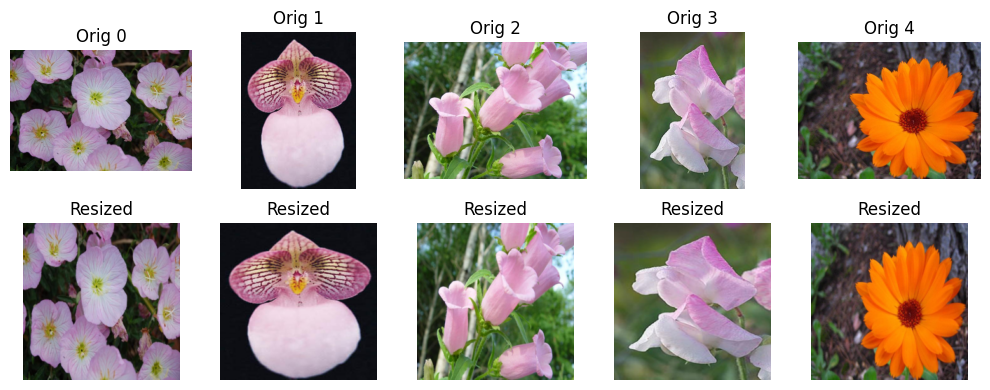

In [ ]:
resize_transform = transforms.Resize((224, 224))
train_dataset2 = Flowers102(root="./data", split="train", transform=None)
# Pick a few sample indices
sample_indices = [0, 10, 20, 30, 40]

plt.figure(figsize=(10, 4))

for i, idx in enumerate(sample_indices):
    img, label = train_dataset2[idx]

    # Original image
    plt.subplot(2, len(sample_indices), i+1)
    plt.imshow(img)
    plt.title(f"Orig {label}")
    plt.axis('off')

    # Resized image
    img_resized = resize_transform(img)
    plt.subplot(2, len(sample_indices), i+1+len(sample_indices))
    plt.imshow(img_resized)
    plt.title(f"Resized")
    plt.axis('off')

plt.tight_layout()
plt.show()

# Part 1
**Conclusion:**

In conclusion, for this dataset training and validation set contain 1020 images for each of the set while for test set it has 6149 images. Each of the training, validation and test has 102 classes. For train and val set, the images are distributed equally(10 image per class), while test is not. There are no overlapping found in each set. The minimum size of image is 500x500px.

****
**Problem:**

The dataset in test set is too little given that there are 102 classes. and test set has too many data. This might lead to potential overfitting as the training data is too little only 10 of each class, given that some flower has a very similar colour and pattern. Some images observed are in multiple shoots of flower and some are present in a clearly single macro shot of flower. Some images also contain complex and cluttered background which will further affect the performance of the model.


### 2. Data Pipeline

two models are chosen resnet50 and EfficientNetb3

**Reasons:**

**Resnet50 -**
was selected as the robust baseline due to its proven 'Residual Learning' architecture, faster training than EfficientNetB3. Smaller input image size (224). higher parameter.

**EfficientNetB3 -** bigger input image size(300) to maximize feature extration, balancing depth and width

**A larger parameter model could be tested, but due to the constraint of Colab Free limit and time, these smaller models are being used. However A better model doesnt mean a better result as the dataset is small, it might result in over fitting**

****
**-Built 2 pipeline, one for img size 224(resnet50) and another for img size 300 (efficientnetb3).**

**-Geometric augmentations, including RandomHorizontalFlip and RandomRotation (limited to ±15°), were employed to simulate natural variations in flower pose and camera angle without creating unrealistic inverted orientations.**

**-color jittering was intentionally excluded; as flower species are often distinguished by specific pigmentations (e.g., distinguishing a yellow lily from a white one), preserving the original RGB intensity was vital to maintain class identity.**

**-all inputs were normalized using standard ImageNet statistics(which the model is pretrained with) (mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])**

In [20]:
norm_mean = [0.485, 0.456, 0.406]
norm_std = [0.229, 0.224, 0.225]
BATCH_SIZE = 32
# --- 224x244 Transforms (For Resnet50) ---
transforms_224 = {
    'train': transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.RandomHorizontalFlip(),
        transforms.RandomRotation(15),
        transforms.ToTensor(),
        transforms.Normalize(norm_mean, norm_std)
    ]),
    'val': transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(norm_mean, norm_std)
    ])
}

# --- 300x300 Transforms (For EfficientNet-B3) ---
transforms_300 = {
    'train': transforms.Compose([
        transforms.Resize((300, 300)),
        transforms.RandomHorizontalFlip(),
        transforms.RandomRotation(15),
        transforms.ToTensor(),
        transforms.Normalize(norm_mean, norm_std)
    ]),
    'val': transforms.Compose([
        transforms.Resize((300, 300)),
        transforms.ToTensor(),
        transforms.Normalize(norm_mean, norm_std)
    ])
}



train_dset_224 = copy.deepcopy(train_dataset)
val_dset_224   = copy.deepcopy(val_dataset)
test_dset_224  = copy.deepcopy(test_dataset)

train_dset_300 = copy.deepcopy(train_dataset)
val_dset_300   = copy.deepcopy(val_dataset)
test_dset_300  = copy.deepcopy(test_dataset)

# Apply specific transforms
train_dset_224.transform = transforms_224['train']
val_dset_224.transform   = transforms_224['val']
test_dset_224.transform  = transforms_224['val']

train_dset_300.transform = transforms_300['train']
val_dset_300.transform   = transforms_300['val']
test_dset_300.transform  = transforms_300['val']


# === Loaders for Resnet50 (224) ===
loader_224 = {
    'train': DataLoader(train_dset_224, batch_size=BATCH_SIZE, shuffle=True, num_workers=2),
    'val':   DataLoader(val_dset_224, batch_size=BATCH_SIZE, shuffle=False, num_workers=2),
    'test':  DataLoader(test_dset_224, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)
}

# === Loaders for EfficientNet-B3 (300) ===
loader_300 = {
    'train': DataLoader(train_dset_300, batch_size=BATCH_SIZE, shuffle=True, num_workers=2),
    'val':   DataLoader(val_dset_300, batch_size=BATCH_SIZE, shuffle=False, num_workers=2),
    'test':  DataLoader(test_dset_300, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)
}

print("Created dual pipelines.")
print(f"224 Loader Train Batches: {len(loader_224['train'])}")
print(f"300 Loader Train Batches: {len(loader_300['train'])}")

Created dual pipelines.
224 Loader Train Batches: 32
300 Loader Train Batches: 32


**Observe the image after transformation**

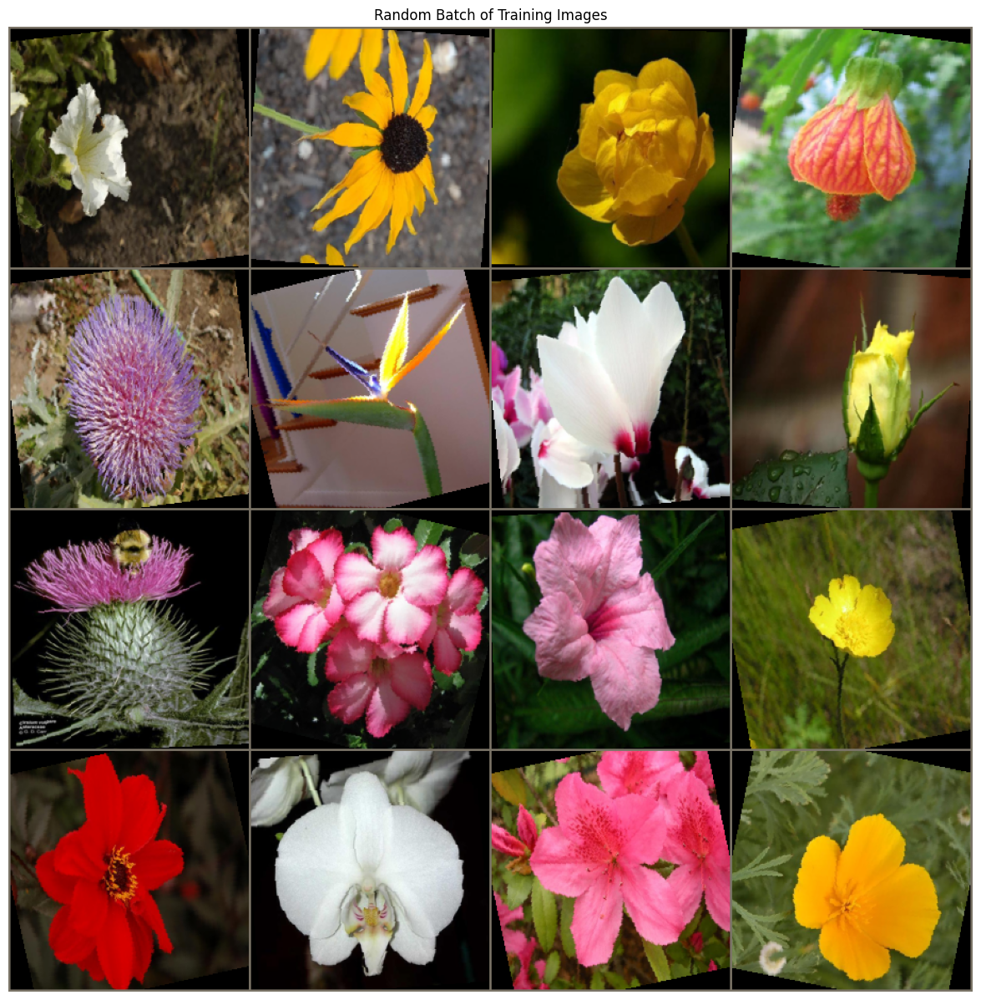

In [ ]:
import torchvision

def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    # Undo normalization for visualization
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)

    plt.figure(figsize=(15, 15))
    plt.imshow(inp)
    if title:
        plt.title(title)
    plt.axis('off')
    plt.show()

# Get a batch of training data

inputs, classes = next(iter(loader_224["train"]))

# Make a grid from a batch (e.g., first 16 images)
out = torchvision.utils.make_grid(inputs[:16], nrow=4, padding=2)

imshow(out, title="Random Batch of Training Images")

# Part 2 Model Development (35%)

**Define the train_model function. Early stop is implemented, patience is the number of epoch for early stop**

In [ ]:
import time
import copy
from tqdm import tqdm

def train_model(model, criterion, optimizer, train_loader, val_loader, num_epochs=25, patience=5):
    """
    Args:
        model: The neural network
        criterion: Loss function (CrossEntropy)
        optimizer: Adam or SGD
        train_loader: DataLoader for training set
        val_loader: DataLoader for validation set
        num_epochs: Max epochs to train
        patience: How many epochs to wait for improvement before stopping (Early Stopping)
    """
    since = time.time()

    # To store the history for plotting later (Metric Logging)
    history = {
        'train_loss': [], 'train_acc': [],
        'val_loss': [], 'val_acc': [],
        'lr': []
    }

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    # Early Stopping variables
    epochs_no_improve = 0

    print("Starting Training...")
    print("-" * 20)

    for epoch in range(num_epochs):
        # GET CURRENT LR
        current_lrs = [pg['lr'] for pg in optimizer.param_groups]
        history['lr'].append(current_lrs) # Saves list like [1e-4, 5e-4]

        if len(current_lrs) == 1:
            lr_msg = f"LR: {current_lrs[0]:.2e}"
        else:
            # Assuming group 0 is backbone and group 1 is head (based on how we built it)
            lr_msg = f"Backbone: {current_lrs[0]:.2e} | Head: {current_lrs[1]:.2e}"

        print(f'Epoch {epoch+1}/{num_epochs} ({lr_msg})')
        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
                dataloader = train_loader
            else:
                model.eval()
                dataloader = val_loader

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data
            for inputs, labels in tqdm(dataloader, desc=phase, leave=False):
                inputs = inputs.to(device)
                labels = labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / len(dataloader.dataset)
            epoch_acc = running_corrects.double() / len(dataloader.dataset)

            print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

            # Store history
            if phase == 'train':
                history['train_loss'].append(epoch_loss)
                history['train_acc'].append(epoch_acc.item())
            else:
                history['val_loss'].append(epoch_loss)
                history['val_acc'].append(epoch_acc.item())

                # Checkpointing: Save model if it's the best so far
                if epoch_acc > best_acc:
                    best_acc = epoch_acc
                    best_model_wts = copy.deepcopy(model.state_dict())
                    # Save explicitly to disk
                    torch.save(model.state_dict(), 'best_model.pth')
                    print(f"--> Best model saved! (Acc: {best_acc:.4f})")
                    epochs_no_improve = 0
                else:
                    epochs_no_improve += 1

        print()

        # Early Stopping Check
        if epochs_no_improve >= patience:
            print(f"Early stopping triggered! No improvement for {patience} epochs.")
            break

    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
    print(f'Best val Acc: {best_acc:4f}')

    # Load best model weights before returning
    model.load_state_dict(best_model_wts)
    return model, history

-Two model are assessed, EfficientNetB3 and Resnet50.

-A two-stage transfer learning strategy was employed to maximize model stability and performance.

-In Stage 1 (Feature Extraction), the pre-trained backbone was frozen, and only the randomly initialized classification head was trained in a very short epoch. This prevented catastrophic forgetting, ensuring that the large error gradients from the untrained head did not corrupt the pre-trained feature extractors .

-Stage 2 (Fine-Tuning) was initiated by unfreezing the entire network. A differential learning rate strategy was applied—using a lower learning rate ($1e^{-4}$) for the backbone to preserve generic features and a higher rate ($5e^{-4}$) for the head to allow for rapid task-specific adaptation.

-This approach allowed the model to retain its robust ImageNet knowledge while specializing in the fine-grained details of the Flowers102 dataset.

-early stop of 3 epoch is set to prevent overtrained for both the model

**Hyperparameter test**

-Training with a higher batch size, 64, the accuracy is lower for both of the model compared to batch size 32.

-For Stage 1 initially a larger epoch is tested, but the final accuracy is low compared to the one uses epoch 2. This is due to when the frozen-backbone phase was trained for a large number of epochs, the classification head tended to overfit to the static feature embeddings, memorizing noise in the training data rather than learning generalizable patterns

-Limiting Stage 1 to a minimal 'warm-up' period(2epoch) proved superior. This brief alignment phase was sufficient to prevent the 'gradient shock' of random initialization without inducing rigidity in the weights. This 'Soft Start' strategy preserved the model's plasticity, allowing for more effective fine-tuning and higher accuracy during Stage 2



# Stage 1 (Finetuning Clasiffier Head)
EfficientNetb3

In [44]:
import torch.nn as nn
import torch.optim as optim
from torchvision import models

# 1. Setup Device (GPU is mandatory for this to finish in time)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# 2. Load Pre-trained EfficientNet-B3
weights_b3 = models.EfficientNet_B3_Weights.IMAGENET1K_V1
model_b3 = models.efficientnet_b3(weights=weights_b3)

# 3. STRATEGY: Freeze the Feature Extractor
for param in model_b3.features.parameters():
    param.requires_grad = False

# 4. Modify the Classifier Head
# The original was for 1000 classes; we need 102.
num_features = model_b3.classifier[1].in_features

model_b3.classifier[1] = nn.Linear(num_features, 102)

model_b3 = model_b3.to(device)

print("Model initialized and moved to GPU.")

criterion = nn.CrossEntropyLoss()

optimizer = optim.Adam(model_b3.parameters(), lr=0.001)

print("Loss function and Optimizer defined.")

print("Efficientnet B3")
trained_model_b3, history_b3 = train_model(
    model_b3,
    criterion,
    optimizer,
    loader_300['train'],
    loader_300['val'],
    num_epochs=2,
    patience=3
)

Using device: cuda
Model initialized and moved to GPU.
Loss function and Optimizer defined.
Efficientnet B3
Starting Training...
--------------------
Epoch 1/2 (LR: 1.00e-03)


train Loss: 4.4715 Acc: 0.1029


val Loss: 3.9853 Acc: 0.4529
--> Best model saved! (Acc: 0.4529)

Epoch 2/2 (LR: 1.00e-03)


train Loss: 3.5090 Acc: 0.6843


val Loss: 3.3938 Acc: 0.6559
--> Best model saved! (Acc: 0.6559)

Training complete in 0m 33s
Best val Acc: 0.655882


Resnet50

In [32]:
# 2. Load Pre-trained ResNet50
weights_50 = models.ResNet50_Weights.IMAGENET1K_V1
model_50 = models.resnet50(weights_50)

# 3. STRATEGY: Freeze the Feature Extractor
for param in model_50.parameters():
    param.requires_grad = False

# 4. Modify the Classifier Head
# The original was for 1000 classes; we need 102.
num_features = model_50.fc.in_features
model_50.fc = nn.Linear(num_features, 102)
model_50 = model_50.to(device)

print("Model initialized and moved to GPU.")

criterion = nn.CrossEntropyLoss()

optimizer = optim.Adam(model_50.parameters(), lr=0.001)

print("Loss function and Optimizer defined.")

print("Resnet 50")
trained_model_50, history_50 = train_model(
    model_50,
    criterion,
    optimizer,
    loader_224['train'],
    loader_224['val'],
    num_epochs=2,
    patience=3
)

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:135: UserWarning: Using 'weights' as positional parameter(s) is deprecated since 0.13 and may be removed in the future. Please use keyword parameter(s) instead.
  warnings.warn(


Model initialized and moved to GPU.
Loss function and Optimizer defined.
Resnet 50
Starting Training...
--------------------
Epoch 1/2 (LR: 1.00e-03)


train Loss: 4.6742 Acc: 0.0588


val Loss: 3.6946 Acc: 0.2020
--> Best model saved! (Acc: 0.2020)

Epoch 2/2 (LR: 1.00e-03)


train Loss: 2.9366 Acc: 0.4843


val Loss: 2.6122 Acc: 0.5118
--> Best model saved! (Acc: 0.5118)

Training complete in 0m 26s
Best val Acc: 0.511765


# Stage2 (Finetuning Backbone and head)
EfficientNetB3

In [45]:
# ==========================================
# STAGE 2: FINE-TUNING (UNFREEZING) FOR EFFICIENTNET-B3
# ==========================================
print("\n" + "="*40)
print("Starting Stage 2: Full Fine-Tuning (EfficientNet-B3)")
print("="*40)

# 1. Unfreeze the entire model
for param in trained_model_b3.parameters():
    param.requires_grad = True

# Identify head parameters (classifier)
head_params_raw = trained_model_b3.classifier[1].parameters()
head_ids = list(map(id, head_params_raw))

# Backbone parameters = everything that isn't the head
backbone_params = filter(lambda p: id(p) not in head_ids, trained_model_b3.parameters())

# 2. Re-create Optimizer with lower LR
# Backbone gets slower LR; head gets slightly higher LR
optimizer_ft = torch.optim.Adam([
    {'params': backbone_params, 'lr': 1e-5},             # Backbone
    {'params': trained_model_b3.classifier[1].parameters(), 'lr': 5e-5} # Head
])

# 3. Train again using the same function
final_model_b3, history_ft_b3 = train_model(
    trained_model_b3,
    criterion,
    optimizer_ft,
    loader_300['train'],
    loader_300['val'],
    num_epochs=40,
    patience=3
)


Starting Stage 2: Full Fine-Tuning (EfficientNet-B3)
Starting Training...
--------------------
Epoch 1/40 (Backbone: 1.00e-05 | Head: 5.00e-05)


train Loss: 2.9604 Acc: 0.8451


val Loss: 3.2359 Acc: 0.6833
--> Best model saved! (Acc: 0.6833)

Epoch 2/40 (Backbone: 1.00e-05 | Head: 5.00e-05)


train Loss: 2.7854 Acc: 0.8520


val Loss: 3.0610 Acc: 0.7245
--> Best model saved! (Acc: 0.7245)

Epoch 3/40 (Backbone: 1.00e-05 | Head: 5.00e-05)


train Loss: 2.6123 Acc: 0.8922


val Loss: 2.9152 Acc: 0.7490
--> Best model saved! (Acc: 0.7490)

Epoch 4/40 (Backbone: 1.00e-05 | Head: 5.00e-05)


train Loss: 2.4445 Acc: 0.9000


val Loss: 2.7495 Acc: 0.7608
--> Best model saved! (Acc: 0.7608)

Epoch 5/40 (Backbone: 1.00e-05 | Head: 5.00e-05)


train Loss: 2.2877 Acc: 0.8922


val Loss: 2.5815 Acc: 0.7824
--> Best model saved! (Acc: 0.7824)

Epoch 6/40 (Backbone: 1.00e-05 | Head: 5.00e-05)


train Loss: 2.1286 Acc: 0.9010


val Loss: 2.4502 Acc: 0.7814

Epoch 7/40 (Backbone: 1.00e-05 | Head: 5.00e-05)


train Loss: 1.9800 Acc: 0.9157


val Loss: 2.3010 Acc: 0.7824

Epoch 8/40 (Backbone: 1.00e-05 | Head: 5.00e-05)


train Loss: 1.8664 Acc: 0.9137


val Loss: 2.1904 Acc: 0.7853
--> Best model saved! (Acc: 0.7853)

Epoch 9/40 (Backbone: 1.00e-05 | Head: 5.00e-05)


train Loss: 1.7600 Acc: 0.9157


val Loss: 2.0666 Acc: 0.7912
--> Best model saved! (Acc: 0.7912)

Epoch 10/40 (Backbone: 1.00e-05 | Head: 5.00e-05)


train Loss: 1.6216 Acc: 0.9245


val Loss: 1.9347 Acc: 0.8039
--> Best model saved! (Acc: 0.8039)

Epoch 11/40 (Backbone: 1.00e-05 | Head: 5.00e-05)


train Loss: 1.4972 Acc: 0.9333


val Loss: 1.8342 Acc: 0.8137
--> Best model saved! (Acc: 0.8137)

Epoch 12/40 (Backbone: 1.00e-05 | Head: 5.00e-05)


train Loss: 1.4162 Acc: 0.9324


val Loss: 1.7327 Acc: 0.8157
--> Best model saved! (Acc: 0.8157)

Epoch 13/40 (Backbone: 1.00e-05 | Head: 5.00e-05)


train Loss: 1.3105 Acc: 0.9480


val Loss: 1.6288 Acc: 0.8314
--> Best model saved! (Acc: 0.8314)

Epoch 14/40 (Backbone: 1.00e-05 | Head: 5.00e-05)


train Loss: 1.2177 Acc: 0.9422


val Loss: 1.5597 Acc: 0.8275

Epoch 15/40 (Backbone: 1.00e-05 | Head: 5.00e-05)


train Loss: 1.1601 Acc: 0.9402


val Loss: 1.4852 Acc: 0.8343
--> Best model saved! (Acc: 0.8343)

Epoch 16/40 (Backbone: 1.00e-05 | Head: 5.00e-05)


train Loss: 1.0624 Acc: 0.9500


val Loss: 1.4128 Acc: 0.8431
--> Best model saved! (Acc: 0.8431)

Epoch 17/40 (Backbone: 1.00e-05 | Head: 5.00e-05)


train Loss: 1.0003 Acc: 0.9549


val Loss: 1.3341 Acc: 0.8510
--> Best model saved! (Acc: 0.8510)

Epoch 18/40 (Backbone: 1.00e-05 | Head: 5.00e-05)


train Loss: 0.9273 Acc: 0.9520


val Loss: 1.2890 Acc: 0.8559
--> Best model saved! (Acc: 0.8559)

Epoch 19/40 (Backbone: 1.00e-05 | Head: 5.00e-05)


train Loss: 0.8763 Acc: 0.9608


val Loss: 1.2373 Acc: 0.8559

Epoch 20/40 (Backbone: 1.00e-05 | Head: 5.00e-05)


train Loss: 0.8093 Acc: 0.9627


val Loss: 1.1766 Acc: 0.8637
--> Best model saved! (Acc: 0.8637)

Epoch 21/40 (Backbone: 1.00e-05 | Head: 5.00e-05)


train Loss: 0.7602 Acc: 0.9667


val Loss: 1.1401 Acc: 0.8657
--> Best model saved! (Acc: 0.8657)

Epoch 22/40 (Backbone: 1.00e-05 | Head: 5.00e-05)


train Loss: 0.7321 Acc: 0.9676


val Loss: 1.0775 Acc: 0.8765
--> Best model saved! (Acc: 0.8765)

Epoch 23/40 (Backbone: 1.00e-05 | Head: 5.00e-05)


train Loss: 0.6775 Acc: 0.9716


val Loss: 1.0527 Acc: 0.8657

Epoch 24/40 (Backbone: 1.00e-05 | Head: 5.00e-05)


train Loss: 0.6273 Acc: 0.9775


val Loss: 1.0099 Acc: 0.8725

Epoch 25/40 (Backbone: 1.00e-05 | Head: 5.00e-05)


train Loss: 0.5885 Acc: 0.9784


val Loss: 0.9681 Acc: 0.8824
--> Best model saved! (Acc: 0.8824)

Epoch 26/40 (Backbone: 1.00e-05 | Head: 5.00e-05)


train Loss: 0.5631 Acc: 0.9745


val Loss: 0.9435 Acc: 0.8843
--> Best model saved! (Acc: 0.8843)

Epoch 27/40 (Backbone: 1.00e-05 | Head: 5.00e-05)


train Loss: 0.5396 Acc: 0.9814


val Loss: 0.9076 Acc: 0.8863
--> Best model saved! (Acc: 0.8863)

Epoch 28/40 (Backbone: 1.00e-05 | Head: 5.00e-05)


train Loss: 0.5052 Acc: 0.9775


val Loss: 0.8656 Acc: 0.8902
--> Best model saved! (Acc: 0.8902)

Epoch 29/40 (Backbone: 1.00e-05 | Head: 5.00e-05)


train Loss: 0.4659 Acc: 0.9804


val Loss: 0.8465 Acc: 0.8892

Epoch 30/40 (Backbone: 1.00e-05 | Head: 5.00e-05)


train Loss: 0.4323 Acc: 0.9892


val Loss: 0.8139 Acc: 0.8951
--> Best model saved! (Acc: 0.8951)

Epoch 31/40 (Backbone: 1.00e-05 | Head: 5.00e-05)


train Loss: 0.4084 Acc: 0.9882


val Loss: 0.8030 Acc: 0.8971
--> Best model saved! (Acc: 0.8971)

Epoch 32/40 (Backbone: 1.00e-05 | Head: 5.00e-05)


train Loss: 0.3968 Acc: 0.9853


val Loss: 0.7770 Acc: 0.8931

Epoch 33/40 (Backbone: 1.00e-05 | Head: 5.00e-05)


train Loss: 0.3673 Acc: 0.9863


val Loss: 0.7539 Acc: 0.9000
--> Best model saved! (Acc: 0.9000)

Epoch 34/40 (Backbone: 1.00e-05 | Head: 5.00e-05)


train Loss: 0.3583 Acc: 0.9902


val Loss: 0.7246 Acc: 0.9020
--> Best model saved! (Acc: 0.9020)

Epoch 35/40 (Backbone: 1.00e-05 | Head: 5.00e-05)


train Loss: 0.3313 Acc: 0.9892


val Loss: 0.7096 Acc: 0.9039
--> Best model saved! (Acc: 0.9039)

Epoch 36/40 (Backbone: 1.00e-05 | Head: 5.00e-05)


train Loss: 0.3069 Acc: 0.9902


val Loss: 0.6822 Acc: 0.9078
--> Best model saved! (Acc: 0.9078)

Epoch 37/40 (Backbone: 1.00e-05 | Head: 5.00e-05)


train Loss: 0.2929 Acc: 0.9951


val Loss: 0.6766 Acc: 0.9020

Epoch 38/40 (Backbone: 1.00e-05 | Head: 5.00e-05)


train Loss: 0.2995 Acc: 0.9873


val Loss: 0.6704 Acc: 0.9049

Epoch 39/40 (Backbone: 1.00e-05 | Head: 5.00e-05)


train Loss: 0.2611 Acc: 0.9922


val Loss: 0.6436 Acc: 0.9059

Early stopping triggered! No improvement for 3 epochs.
Training complete in 18m 15s
Best val Acc: 0.907843


ResNet50

In [33]:
# ==========================================
# STAGE 2: FINE-TUNING (UNFREEZING) ResNet50
# ==========================================

print("\n" + "="*40)
print("Starting Stage 2: Full Fine-Tuning For Resnet50")
print("="*40)

# 1. Unfreeze the entire model
# Now we allow the pre-trained "backbone" to learn specific details about flowers
for param in trained_model_50.parameters():
    param.requires_grad = True

head_params_raw = trained_model_50.fc.parameters()
head_ids = list(map(id, head_params_raw))

# "backbone_params" will contain everything that ISN'T in the head
backbone_params = filter(lambda p: id(p) not in head_ids, trained_model_50.parameters())

# 2. Re-create Optimizer with a MUCH lower learning rate
optimizer_ft = torch.optim.Adam([
    {'params': backbone_params, 'lr': 1e-4},            # Backbone (Slower learning)
    {'params': trained_model_50.fc.parameters(), 'lr': 5e-4} # Head (Faster learning)
])

# 3. Train again
final_model_50, history_ft_50 = train_model(
    trained_model_50,
    criterion,
    optimizer_ft,
    loader_224['train'],
    loader_224['val'],
    num_epochs=40,
    patience=3
)


Starting Stage 2: Full Fine-Tuning For Resnet50
Starting Training...
--------------------
Epoch 1/40 (Backbone: 1.00e-04 | Head: 5.00e-04)


train Loss: 1.6041 Acc: 0.6961


val Loss: 0.9754 Acc: 0.7951
--> Best model saved! (Acc: 0.7951)

Epoch 2/40 (Backbone: 1.00e-04 | Head: 5.00e-04)


train Loss: 0.4337 Acc: 0.9529


val Loss: 0.5851 Acc: 0.8853
--> Best model saved! (Acc: 0.8853)

Epoch 3/40 (Backbone: 1.00e-04 | Head: 5.00e-04)


train Loss: 0.1311 Acc: 0.9961


val Loss: 0.4583 Acc: 0.9108
--> Best model saved! (Acc: 0.9108)

Epoch 4/40 (Backbone: 1.00e-04 | Head: 5.00e-04)


train Loss: 0.0553 Acc: 1.0000


val Loss: 0.4039 Acc: 0.9098

Epoch 5/40 (Backbone: 1.00e-04 | Head: 5.00e-04)


train Loss: 0.0310 Acc: 1.0000


val Loss: 0.3752 Acc: 0.9176
--> Best model saved! (Acc: 0.9176)

Epoch 6/40 (Backbone: 1.00e-04 | Head: 5.00e-04)


train Loss: 0.0224 Acc: 0.9990


val Loss: 0.3677 Acc: 0.9157

Epoch 7/40 (Backbone: 1.00e-04 | Head: 5.00e-04)


train Loss: 0.0197 Acc: 0.9990


val Loss: 0.3592 Acc: 0.9176

Epoch 8/40 (Backbone: 1.00e-04 | Head: 5.00e-04)


train Loss: 0.0138 Acc: 1.0000


val Loss: 0.3318 Acc: 0.9245
--> Best model saved! (Acc: 0.9245)

Epoch 9/40 (Backbone: 1.00e-04 | Head: 5.00e-04)


train Loss: 0.0110 Acc: 1.0000


val Loss: 0.3121 Acc: 0.9382
--> Best model saved! (Acc: 0.9382)

Epoch 10/40 (Backbone: 1.00e-04 | Head: 5.00e-04)


train Loss: 0.0082 Acc: 1.0000


val Loss: 0.3081 Acc: 0.9333

Epoch 11/40 (Backbone: 1.00e-04 | Head: 5.00e-04)


train Loss: 0.0064 Acc: 1.0000


val Loss: 0.3018 Acc: 0.9333

Epoch 12/40 (Backbone: 1.00e-04 | Head: 5.00e-04)


train Loss: 0.0058 Acc: 1.0000


val Loss: 0.2954 Acc: 0.9324

Early stopping triggered! No improvement for 3 epochs.
Training complete in 3m 40s
Best val Acc: 0.938235


**Model accuracy and loss graph**

**EfficientNetB3**

Slower Training Time, best val accuracy 0.907843, higher loss

**Resnet50**

Faster training Time, best val accuracy 0.938235, lower loss


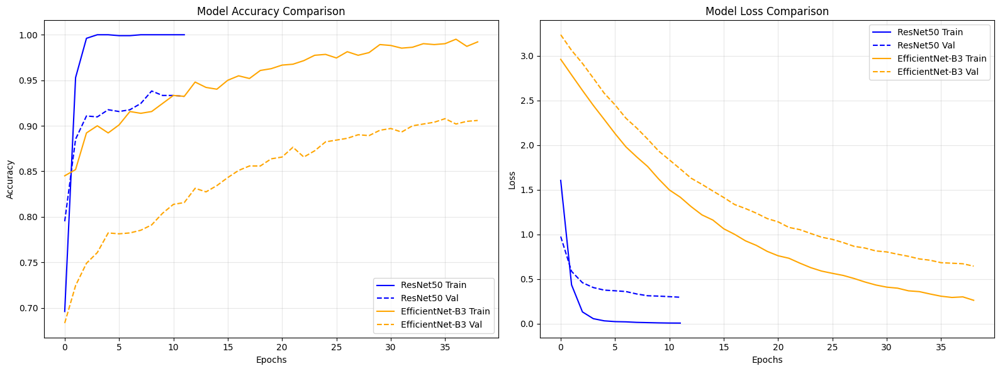

In [46]:
def plot_model_comparison(hist1, name1, hist2, name2):
    """
    Plots comparison of Accuracy and Loss for two models.
    """
    # Create a figure with two subplots (side by side)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

    # --- Plot 1: Accuracy Comparison ---
    # Model 1 (ResNet50)
    ax1.plot(hist1['train_acc'], label=f'{name1} Train', color='blue', linestyle='-')
    ax1.plot(hist1['val_acc'], label=f'{name1} Val', color='blue', linestyle='--')

    # Model 2 (EfficientNet-B3)
    ax1.plot(hist2['train_acc'], label=f'{name2} Train', color='orange', linestyle='-')
    ax1.plot(hist2['val_acc'], label=f'{name2} Val', color='orange', linestyle='--')

    ax1.set_title('Model Accuracy Comparison')
    ax1.set_xlabel('Epochs')
    ax1.set_ylabel('Accuracy')
    ax1.legend()
    ax1.grid(True, alpha=0.3)

    # --- Plot 2: Loss Comparison ---
    # Model 1 (ResNet50)
    ax2.plot(hist1['train_loss'], label=f'{name1} Train', color='blue', linestyle='-')
    ax2.plot(hist1['val_loss'], label=f'{name1} Val', color='blue', linestyle='--')

    # Model 2 (EfficientNet-B3)
    ax2.plot(hist2['train_loss'], label=f'{name2} Train', color='orange', linestyle='-')
    ax2.plot(hist2['val_loss'], label=f'{name2} Val', color='orange', linestyle='--')

    ax2.set_title('Model Loss Comparison')
    ax2.set_xlabel('Epochs')
    ax2.set_ylabel('Loss')
    ax2.legend()
    ax2.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()

plot_model_comparison(history_ft_50, "ResNet50", history_ft_b3, "EfficientNet-B3")

**Conclusion**

# Part 3 Evaluate & Analysis (25%)
### Quantitative Metrics

RESNET50
Generating predictions...

CLASSIFICATION REPORT
Overall Test Accuracy: 90.29%
              precision    recall  f1-score   support

           0       0.39      1.00      0.56        20
           1       0.95      1.00      0.98        40
           2       0.57      0.65      0.60        20
           3       0.84      0.44      0.58        36
           4       0.98      0.93      0.95        45
           5       0.96      0.96      0.96        25
           6       0.87      1.00      0.93        20
           7       0.98      1.00      0.99        65
           8       0.69      0.96      0.81        26
           9       1.00      1.00      1.00        25
          10       0.89      0.75      0.81        67
          11       0.93      0.97      0.95        67
          12       0.94      1.00      0.97        29
          13       0.97      1.00      0.98        28
          14       0.88      1.00      0.94        29
          15       0.64      1.00      0.78    

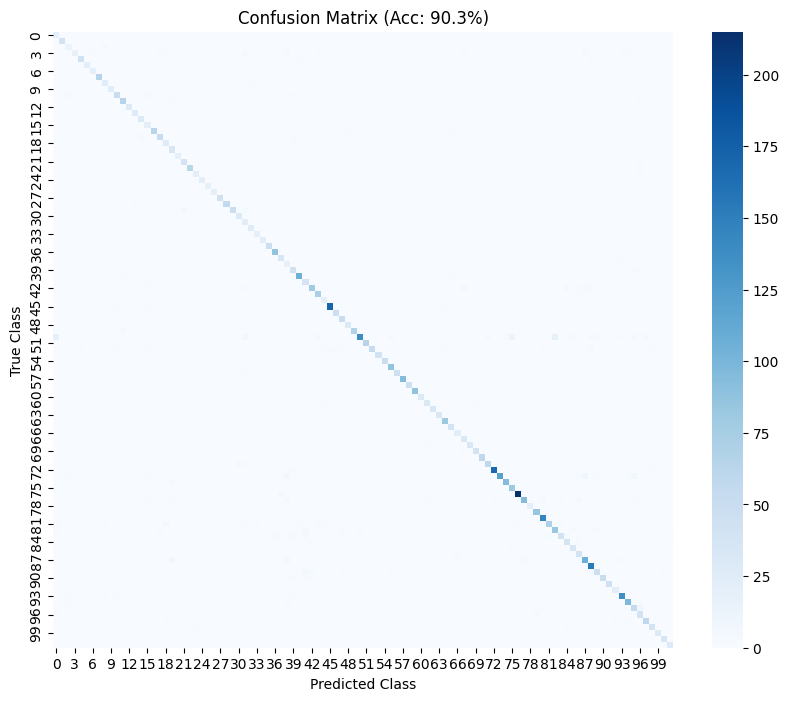

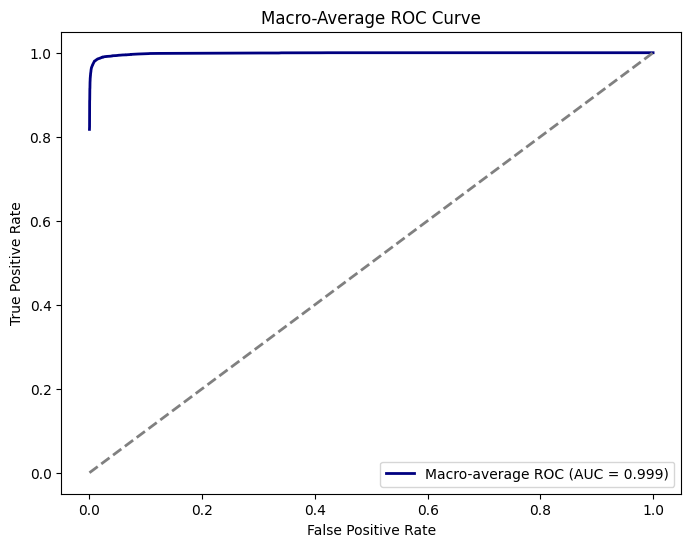

Macro-average ROC AUC For Efficient B3: 0.999


In [51]:
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_curve, auc
from sklearn.preprocessing import label_binarize


def evaluate_model_macro_roc(model, dataloader, num_classes=102):
    model.eval()
    all_preds, all_labels, all_probs = [], [], []
    mistakes_data = []

    print("Generating predictions...")
    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            probs = torch.softmax(outputs, dim=1)
            _, preds = torch.max(outputs, 1)

            preds_cpu = preds.cpu().numpy()
            labels_cpu = labels.cpu().numpy()
            probs_cpu = probs.cpu().numpy()

            all_preds.extend(preds_cpu)
            all_labels.extend(labels_cpu)
            all_probs.extend(probs_cpu)

            for i in range(len(labels_cpu)):
                if preds_cpu[i] != labels_cpu[i]:
                    mistakes_data.append((inputs[i].cpu().clone(), labels_cpu[i], preds_cpu[i]))

    all_labels = np.array(all_labels)
    all_preds = np.array(all_preds)
    all_probs = np.array(all_probs)

    # --- Classification Metrics ---
    print("\n" + "="*30)
    print("CLASSIFICATION REPORT")
    print("="*30)
    acc = accuracy_score(all_labels, all_preds)
    print(f"Overall Test Accuracy: {acc*100:.2f}%")
    print(classification_report(all_labels, all_preds))

    # --- Confusion Matrix ---
    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=False, cmap='Blues')
    plt.title(f'Confusion Matrix (Acc: {acc*100:.1f}%)')
    plt.xlabel('Predicted Class')
    plt.ylabel('True Class')
    plt.show()

    # --- Macro-Average ROC Curve ---
    y_bin = label_binarize(all_labels, classes=np.arange(num_classes))
    fpr, tpr, roc_auc = dict(), dict(), dict()

    for i in range(num_classes):
        fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], all_probs[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Macro-average
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(num_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
    mean_tpr /= num_classes
    macro_auc = auc(all_fpr, mean_tpr)

    plt.figure(figsize=(8, 6))
    plt.plot(all_fpr, mean_tpr, color='navy', linestyle='-', linewidth=2,
             label=f'Macro-average ROC (AUC = {macro_auc:.3f})')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--', lw=2)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Macro-Average ROC Curve')
    plt.legend(loc="lower right")
    plt.show()

    return mistakes_data, all_labels, all_preds, macro_auc

print("RESNET50")
mistakes_data_50, test_labels_50, test_preds_50, macro_auc_50 = evaluate_model_macro_roc(final_model_50, loader_224['test'])
print(f"Macro-average ROC AUC For resnet50: {macro_auc_50:.3f}")

### Error Analysis

There are 40 classes are below the average f1 score 0.90. The lowest one is 0.58 which is siam tulip(id 38) and sweet pea(id 3).

Looking at the classification reports, there are also class like class0 that has low prediction and high recall. it means that for the all the image in class0 are predicted correctly however other class are being misclassified as class0, hence making the prediction wrong. This can prove that class 0 are very similar to some other class in terms of colour or patterns, this is where the confusion comes from.

for class that has high predicition and low recall, The model is "under-predicting". for example in class 3 It sees many Class 3 instances but likely classifies them as something else (perhaps dumping them into that classes like Class 0) because it isn't confident enough to call them Class 3. This is due to the similarity of colour or pattern

**Reasons**

-Colour similarity, the model misclasiffied the two flower that has a very similar colour

-Pattern similarity, the model misclasiffied the two flower that has a very similar pattern

-Number of shoots, some images has multiple shoots of flower like petunia id 50, and some only contain a single shoots in a image.this might affect the classification

-Background, the background of the images are very different, some has no background some has green environment some are in deserted environment

-Size of dataset, the size of the train set is too little, it is hard to distinguish flowers that have similar pattern and flower given that only contain 10 images of each classes

**potential improvement**

-increase the train set by reduce the number of data in test set.

-use segmentation, segment out only the flower and leave the background empty.

-add attention mechanism, integrate attention modules into the ResNet backbone.This would help the model handle the multiple shoots images by learning to focus only on the relevant parts of the image.


In [52]:
from sklearn.metrics import classification_report

def visualize_below_average_classes(mistakes_data, all_labels, all_preds, dataloader, class_names):
    """
    Visualizes classes where the model performs worse than average.
    Now includes REAL CLASS NAMES in the titles.
    """
    print("Calculating per-class accuracy...")

    # 1. Calculate Per-Class Accuracy
    report = classification_report(all_labels, all_preds, output_dict=True)

    avg_f1 = report['macro avg']['f1-score']
    print(f"Average F1-Score Threshold: {avg_f1:.2f}")

    # Find classes below this threshold
    weak_classes = []
    for cls_id in range(102):
        cls_str = str(cls_id)
        if cls_str in report:
            score = report[cls_str]['f1-score']
            if score < avg_f1:
                weak_classes.append((cls_id, score))

    # Sort them by score (worst first)
    weak_classes.sort(key=lambda x: x[1])
    print(f"Found {len(weak_classes)} classes below average performance.")

    # 2. Select examples
    examples_to_plot = []
    needed_ref_classes = set()

    # Limit to first 20 just to prevent crashing
    for cls_id, score in weak_classes[:20]:
        found = False
        for img, true_c, pred_c in mistakes_data:
            if true_c == cls_id:
                examples_to_plot.append((img, true_c, pred_c, score))
                needed_ref_classes.add(pred_c)
                found = True
                break
        if not found:
            pass # Class might have low score due to 0 precision, but no captured image in mistakes buffer

    # 3. Find Reference Images
    print("Fetching reference images for comparison...")
    ref_images = {}

    # Create a fresh iterator so we don't mess up the main one
    data_iter = iter(dataloader)

    # Search through the dataloader until we find one example of every needed class
    # (Safety break after 50 batches to prevent infinite loops if class is missing)
    max_batches = 50
    batch_count = 0

    while len(ref_images) < len(needed_ref_classes) and batch_count < max_batches:
        try:
            inputs, labels = next(data_iter)
            batch_count += 1
        except StopIteration:
            break

        for i in range(len(labels)):
            lbl = labels[i].item()
            if lbl in needed_ref_classes and lbl not in ref_images:
                ref_images[lbl] = inputs[i].clone()

    # 4. Plot
    print("\n" + "="*50)
    print(f" VISUALIZING {len(examples_to_plot)} BELOW-AVERAGE CLASSES")
    print("="*50)

    plt.figure(figsize=(12, 4 * len(examples_to_plot)))

    for i, (bad_img, true_cls, pred_cls, score) in enumerate(examples_to_plot):

        # Prepare Actual Image
        img_act = bad_img.permute(1, 2, 0).numpy()
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        img_act = std * img_act + mean
        img_act = np.clip(img_act, 0, 1)

        # Prepare Reference Image (Predicted Class)
        if pred_cls in ref_images:
            img_ref = ref_images[pred_cls].permute(1, 2, 0).numpy()
            img_ref = std * img_ref + mean
            img_ref = np.clip(img_ref, 0, 1)
        else:
            img_ref = np.zeros_like(img_act) # Black box if not found

        # --- GET NAMES ---
        true_name = class_names[true_cls]
        pred_name = class_names[pred_cls]

        # Plot 1: The Mistake
        plt.subplot(len(examples_to_plot), 2, i*2 + 1)
        plt.imshow(img_act)
        plt.title(f"ACTUAL: {true_name}\n(ID: {true_cls} | F1: {score:.2f})", color='green', fontweight='bold', fontsize=10)
        plt.axis('off')

        # Plot 2: What the model thought it was
        plt.subplot(len(examples_to_plot), 2, i*2 + 2)
        plt.imshow(img_ref)
        plt.title(f"CONFUSED WITH: {pred_name}\n(ID: {pred_cls})", color='red', fontweight='bold', fontsize=10)
        plt.axis('off')

    plt.tight_layout()
    plt.show()


 RESNET50
Calculating per-class accuracy...
Average F1-Score Threshold: 0.90
Found 40 classes below average performance.
Fetching reference images for comparison...

 VISUALIZING 17 BELOW-AVERAGE CLASSES


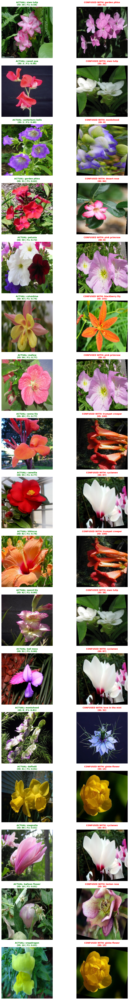

In [53]:
print(f" RESNET50")
print("="*50)
my_class_names = train_dataset.classes

visualize_below_average_classes(
    mistakes_data_50,
    test_labels_50,
    test_preds_50,
    loader_224["train"],
    my_class_names
)

### Model Analysis


**Model Analysis**

-A small parameter model is choosen as the training data is very less, this is to prevent overfitting

-ResNet50 slightly outperform EfficientNetb3 in terms of accuracy 0.938235 and 0.907843 and the finetuning time of ResNet50 is faster than EfficientNetb3.

-Eventhough the Model parameter of ResNet50 (25M) is double the amount of EfficientNet (12M), the image size of efficientnet(300x300) is bigger hence making it slower.

-ResNet50 offered the superior trade-off, it maximized training stability and inference speed by utilizing a standard resolution, whereas EfficientNet's parameter efficiency was negated by the computational overhead of processing larger images.

-However both the model are slightly overfitting (training acc is better than val acc for around 7-10%), but overall both the model are still considered good given the number of data used to train

-Final model = ResNet50

**Hyperparameter test**

-Training with a higher batch size, 64, the accuracy is lower for both of the model compared to batch size 32.

-For Stage 1 initially a larger epoch is tested, but the final accuracy is low compared to the one uses epoch 2. This is due to when the frozen-backbone phase was trained for a large number of epochs, the classification head tended to overfit to the static feature embeddings, memorizing noise in the training data rather than learning generalizable patterns

-Limiting Stage 1 to a minimal 'warm-up' period(2epoch) proved superior. This brief alignment phase was sufficient to prevent the 'gradient shock' of random initialization without inducing rigidity in the weights. This 'Soft Start' strategy preserved the model's plasticity, allowing for more effective fine-tuning and higher accuracy during Stage 2


# Part 4 Explainability & Interpretability (15%)
### Visual Explanations

To validate how the model makes decisions, i applied Grad-CAM visualization to both correctly classified and misclassified samples.

In [40]:
!pip install grad-cam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 124.5 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for grad-cam: filename=grad_cam-1.5.5-py3-none-any.whl size=44284 sha256=79ec17137564250ae363932e504bdddf06741a149cc9004d23a7febd40f39bd4
  Stored in directory: /root/.cache/pip/wheels/fb/3b/09/2afc520f3d69bc26ae6bd87416759c820a3f7d05c1a077bbf6
Successfully built grad-cam


Searching for examples...

Generating Grad-CAM for 16 images...


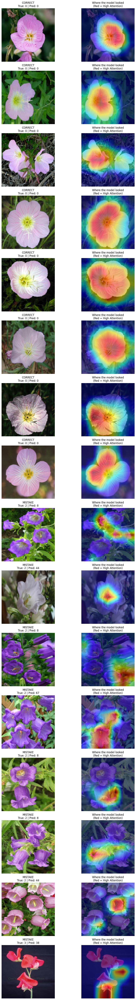

In [48]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
import cv2

def run_gradcam_analysis(model, target_layers, input_tensor, input_image_float, true_label, pred_label):
    """
    Runs Grad-CAM on a single image and returns the visualization.
    """
    # 1. Initialize Grad-CAM
    cam = GradCAM(model=model, target_layers=target_layers)

    # 2. Define which class we want to explain
    targets = [ClassifierOutputTarget(pred_label)]

    # 3. Generate the heatmap
    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
    grayscale_cam = grayscale_cam[0, :] # Take first item in batch

    # 4. Overlay heatmap on original image
    visualization = show_cam_on_image(input_image_float, grayscale_cam, use_rgb=True)

    return visualization

def visualize_model_decisions(model, dataloader, num_samples=3):
    model.eval()

    target_layers = [model.layer4[-1]]

    correct_samples = []
    incorrect_samples = []

    print("Searching for examples...")
    for inputs, labels in dataloader:
        inputs = inputs.to(device)
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)

        for i in range(len(labels)):
            if len(correct_samples) < num_samples and preds[i] == labels[i]:
                correct_samples.append((inputs[i], labels[i].item(), preds[i].item()))

            if len(incorrect_samples) < num_samples and preds[i] != labels[i]:
                incorrect_samples.append((inputs[i], labels[i].item(), preds[i].item()))

        if len(correct_samples) >= num_samples and len(incorrect_samples) >= num_samples:
            break

    all_samples = correct_samples + incorrect_samples
    labels_type = ["CORRECT"] * num_samples + ["MISTAKE"] * num_samples

    plt.figure(figsize=(12, 4 * len(all_samples)))

    print(f"\nGenerating Grad-CAM for {len(all_samples)} images...")

    for i, (tensor_img, true_lbl, pred_lbl) in enumerate(all_samples):
        input_tensor = tensor_img.unsqueeze(0).to(device)

        img_float = tensor_img.permute(1, 2, 0).cpu().numpy()
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        img_float = std * img_float + mean
        img_float = np.clip(img_float, 0, 1)

        # Run Grad-CAM
        heatmap_viz = run_gradcam_analysis(model, target_layers, input_tensor, img_float, true_lbl, pred_lbl)

        # Plot Original
        plt.subplot(len(all_samples), 2, 2*i + 1)
        plt.imshow(img_float)
        plt.title(f"{labels_type[i]}\nTrue: {true_lbl} | Pred: {pred_lbl}")
        plt.axis('off')

        # Plot Heatmap
        plt.subplot(len(all_samples), 2, 2*i + 2)
        plt.imshow(heatmap_viz)
        plt.title(f"Where the model looked\n(Red = High Attention)")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

visualize_model_decisions(final_model_50, loader_224['test'], num_samples=8)

### Analysis

**Correctly Classified Samples**

-Focus on Discriminative Features: As seen in the top and bottom rows of the "Correct" figure, the high-attention regions (Red/Yellow) are tightly concentrated on the reproductive organs (stamen/pistil) and the petal texture.

-Background Suppression: The model successfully ignores the surrounding green foliage. The heatmap on the leaves is deep blue, confirming that the model is classifying the object based on the flower itself, not the environment.

**Misclassified Samples**

-the model struggles with complex pose variations. When a flower is irregular or "messy" (multiple focal points), the model's attention becomes scattered, leading to lower confidence and eventual misclassification

****
**Conclusion**

When the image consists only one single macro shoot of flower, the model can correctly identify the flower, however when the flower has a lot of shoots, the image is now more messy, and the model will start to lose focus and hence unable to classifier correctly.

# Model and Class Name Export

In [43]:
from google.colab import files

files.download('best_model.pth')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [47]:
import json

# 1. Extract the list of names from your dataset
class_names = train_dataset.classes

# 2. Save it to a JSON file
with open('flower_class_names.json', 'w') as f:
    json.dump(class_names, f)

print(f"Saved {len(class_names)} class names to flower_class_names.json")

# 3. Download it immediately
files.download('flower_class_names.json')

Saved 102 class names to flower_class_names.json


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>